In [7]:
import pandas as pd
import numpy as np

import os
import sys
import glob
from tqdm.notebook import tqdm
from typing import Dict, Any
from copy import deepcopy

import librosa
import librosa.display
from IPython.display import Audio
from PIL import Image


import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report,roc_auc_score
from sklearn.model_selection import StratifiedKFold, train_test_split


import torch
from torch import LongTensor, FloatTensor, HalfTensor, Tensor
from torch.utils.data import Dataset, DataLoader
from copy import deepcopy
from torch import nn, optim
import torch.nn.functional as F
import inspect

import timm
from catalyst import dl, utils

import warnings
#warnings.filterwarnings("ignore")


from resemblyzer import preprocess_wav, VoiceEncoder
from spectralcluster import SpectralClusterer
encoder = VoiceEncoder("cuda:0")
from pathlib import Path
from matplotlib import pyplot as plt

import speech_recognition
from resemblyzer.audio import sampling_rate

Loaded the voice encoder model on cuda in 3.46 seconds.


In [9]:
audio_file_path = f'test_dialogs/neutral_b62dc73f8693d67f4b336c0a8c57c756.wav'

In [10]:
wav = preprocess_wav(audio_file_path)

In [16]:
import soundfile as sf

sf.write('test_dialogs/tmp.wav', wav, sampling_rate)

In [23]:
a, cont_embeds, wav_splits = encoder.embed_utterance(wav, return_partials=True,)

(86, 256)


In [25]:
clusterer = SpectralClusterer(
    min_clusters=2,
    max_clusters=3,
    #p_percentile=0.90,
    #gaussian_blur_sigma=1
)

labels = clusterer.predict(cont_embeds)

In [26]:
def create_labelling(labels,wav_splits):
    from resemblyzer.audio import sampling_rate
    times = [((s.start + s.stop) / 2) / sampling_rate for s in wav_splits]
    labelling = []
    start_time = 0

    for i,time in enumerate(times):
        if i>0 and labels[i]!=labels[i-1]:
            temp = [str(labels[i-1]),start_time,time]
            labelling.append(tuple(temp))
            start_time = time
        if i==len(times)-1:
            temp = [str(labels[i]),start_time,time]
            labelling.append(tuple(temp))

    return labelling
  
labelling = create_labelling(labels, wav_splits)

In [100]:
Res = pd.DataFrame(labelling, columns=['person', 'start', 'end'])
Res['path'] = 'test_dialogs/tmp.wav'
Res

,person,start,end,path
0,0,0.00,4.65,test_dialogs/tmp.wav
1,1,4.65,8.50,test_dialogs/tmp.wav
2,0,8.50,9.27,test_dialogs/tmp.wav
3,1,9.27,13.89,test_dialogs/tmp.wav
4,0,13.89,16.97,test_dialogs/tmp.wav
5,1,16.97,21.59,test_dialogs/tmp.wav
6,0,21.59,33.14,test_dialogs/tmp.wav
7,1,33.14,33.91,test_dialogs/tmp.wav
8,0,33.91,37.76,test_dialogs/tmp.wav
9,1,37.76,43.92,test_dialogs/tmp.wav


In [101]:
PERIOD=5

class Lang_and_Emotional_Dataset(Dataset):
    def __init__(self, dataset, target=None, idx=None, melspectrogram_parameters={}):
        self.path = np.array(dataset.path)
        if target is not None:
            self.target = FloatTensor(np.array(target))
        else:
            self.target = None
        self.index = idx
        self.melspectrogram_parameters = melspectrogram_parameters
        self.start = dataset.start.values
        self.end = dataset.end.values
        self.sample_rate = 8000
        
    def __len__(self):
        return len(self.path)

    def __getitem__(self, idx):
        
        y, sampling_rate = librosa.load(self.path[idx], sr=self.sample_rate, duration=60)
        
        y = y[int(self.sample_rate*self.start[idx]):int(self.sample_rate*self.end[idx])]
        len_y = len(y)
        effective_length = sampling_rate * PERIOD

        if len_y < effective_length:
            new_y = np.zeros(effective_length, dtype=y.dtype)
            start = int((effective_length - len_y)/2)#np.random.randint(effective_length - len_y)
            new_y[start:start + len_y] = y
            y = new_y.astype(np.float32)
        elif len_y > effective_length:
            start = int((len_y - effective_length )/2)#np.random.randint(effective_length - len_y)
            #start = np.random.randint(len_y - effective_length)
            y = y[start:start + effective_length].astype(np.float32)
        else:
            y = y.astype(np.float32)
        S = np.abs(librosa.stft(y));

        melspec = librosa.power_to_db(S**2, ref=np.max)
        
        sample = {'features':  FloatTensor(np.expand_dims(melspec, 0))}
        if self.target is not None:
            sample['targets'] = self.target[idx]#labels.flatten()
            
        return sample
    
def worker_init_fn(worker_id):
    np.random.seed(np.random.get_state()[1][0] + worker_id)

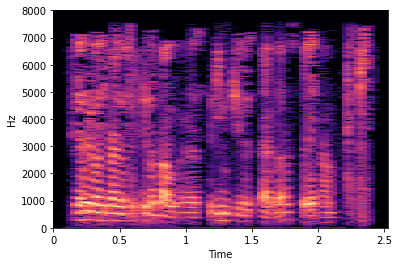

In [102]:
A_temp = Lang_and_Emotional_Dataset(Res)
smp = A_temp[0]
img = smp['features'].numpy()
librosa.display.specshow(img[0], sr=2*8000, x_axis='time', y_axis='hz')   

In [103]:
class TimmModel_em(nn.Module):
    def __init__(self, name_of_model='tf_efficientnet_b0_ns', pretrained=True,n_of_class_emotion=7):
        super().__init__()

        self.img_model = timm.create_model(name_of_model, pretrained=pretrained, in_chans=1)
        self.classifier = nn.Sequential(nn.ELU(), nn.Dropout(0.2), nn.Linear(in_features=1000, out_features=n_of_class_emotion))

    def forward(self, features):
        
        return self.classifier(
            self.img_model(
                   features
            )
        )

In [104]:
from sklearn.metrics import accuracy_score

device = 'cuda:0'
EXP_PATH_em = 'Emotion/New_dataset'
model_em = TimmModel_em().to(device)
model_em.load_state_dict(torch.load(f'{EXP_PATH_em}/checkpoints/best.pth', map_location=device)['model_state_dict'])
model_em = model_em.eval()

In [105]:
class TimmModel_lan(nn.Module):
    def __init__(self, name_of_model='tf_efficientnet_b0_ns', pretrained=True):
        super().__init__()

        self.img_model = timm.create_model(name_of_model, pretrained=pretrained, in_chans=1)
        self.classifier = nn.Sequential(nn.ELU(), nn.Dropout(0.2), nn.Linear(in_features=1000, out_features=1))

    def forward(self, features):
        
        return self.classifier(
            self.img_model(
                   features
            )
        ).flatten()

In [106]:
EXP_PATH_lan = 'Lang/New_dataset'
model_lan = TimmModel_lan().to(device)
model_lan.load_state_dict(torch.load(f'{EXP_PATH_lan}/checkpoints/best.pth', map_location=device)['model_state_dict'])
model_lan = model_lan.eval()

In [107]:
Pred_em = []
Pred_lan = []
for i in range(len(A_temp)):
    image = A_temp[i]['features']
    image = image.unsqueeze(0).to(device)
    Pred_em.append(model_em(image).sigmoid().cpu().data.numpy()[0])
    Pred_lan.append(model_lan(image).sigmoid().cpu().data.numpy()[0])

In [108]:
dict_of_class = {
    'neutral': 0,
    'sad': 1,
    'happy': 2,
    'angry': 3,
    'disgust': 4,
    'fear': 5,
    'surprise': 6,
    }

inv_class_dict = {}
for k in dict_of_class:
    inv_class_dict[dict_of_class[k]]=k

In [109]:
Res['lan'] = Pred_lan
Res['lan'] = Res['lan'].round()
Res['lan'] = Res['lan'].replace({0:'uk-UA',1:'ru-RU'})

Res['em'] = ''
Res['em_ch'] = 0

Res['em_ch'] = pd.DataFrame(Pred_em).apply(lambda row: row[row.argmax()], axis=1)
Res['em'] = pd.DataFrame(Pred_em).apply(lambda row: row.argmax(), axis=1)
Res.em = Res.em.replace(inv_class_dict)

In [110]:
Res

,person,start,end,path,lan,em,em_ch
0,0,0.00,4.65,test_dialogs/tmp.wav,ru-RU,angry,0.996995
1,1,4.65,8.50,test_dialogs/tmp.wav,ru-RU,fear,0.996624
2,0,8.50,9.27,test_dialogs/tmp.wav,ru-RU,surprise,0.999627
3,1,9.27,13.89,test_dialogs/tmp.wav,ru-RU,sad,0.996365
4,0,13.89,16.97,test_dialogs/tmp.wav,ru-RU,sad,0.993811
5,1,16.97,21.59,test_dialogs/tmp.wav,ru-RU,disgust,0.990318
6,0,21.59,33.14,test_dialogs/tmp.wav,ru-RU,disgust,0.992993
7,1,33.14,33.91,test_dialogs/tmp.wav,ru-RU,surprise,0.998987
8,0,33.91,37.76,test_dialogs/tmp.wav,uk-UA,sad,0.999218
9,1,37.76,43.92,test_dialogs/tmp.wav,ru-RU,sad,0.999138


In [111]:
Audio(audio_file_path)

In [112]:
y, sampling_rate = librosa.load('test_dialogs/tmp.wav', sr=16000)
Audio(y, rate=sampling_rate)

In [130]:
Recognizer = speech_recognition.Recognizer()

In [135]:
Res

,person,start,end,path,lan,em,em_ch
0,0,0.00,4.65,test_dialogs/tmp.wav,ru-RU,angry,0.996995
1,1,4.65,8.50,test_dialogs/tmp.wav,ru-RU,fear,0.996624
2,0,8.50,9.27,test_dialogs/tmp.wav,ru-RU,surprise,0.999627
3,1,9.27,13.89,test_dialogs/tmp.wav,ru-RU,sad,0.996365
4,0,13.89,16.97,test_dialogs/tmp.wav,ru-RU,sad,0.993811
5,1,16.97,21.59,test_dialogs/tmp.wav,ru-RU,disgust,0.990318
6,0,21.59,33.14,test_dialogs/tmp.wav,ru-RU,disgust,0.992993
7,1,33.14,33.91,test_dialogs/tmp.wav,ru-RU,surprise,0.998987
8,0,33.91,37.76,test_dialogs/tmp.wav,uk-UA,sad,0.999218
9,1,37.76,43.92,test_dialogs/tmp.wav,ru-RU,sad,0.999138


In [144]:
def predict_N_audio(N):
    row = Res.iloc[N]

    print('Speaker =', row['person'])
    print('start:end =', str(row['start'])+':'+str(row['end']) )
    print('Lang =', row['lan'])
    print('Emotion =', row['em'])

    tmp_wave = y[int(sampling_rate*row['start']):int(sampling_rate*row['end'])]

    len_y = len(tmp_wave)
    new_y = np.zeros(2*sampling_rate+len_y, dtype=y.dtype)
    new_y[sampling_rate:-sampling_rate] = tmp_wave
    tmp_wave= new_y

    sf.write('test_dialogs/tmp_for_predict.wav', tmp_wave, sampling_rate)

    with speech_recognition.AudioFile('test_dialogs/tmp_for_predict.wav') as source:
        audio_data = Recognizer.record(source)
        text = Recognizer.recognize_google(audio_data, language=row['lan'])
        print(text)
    return tmp_wave

In [145]:
tmp_wave = predict_N_audio(5)
Audio(tmp_wave, rate=sampling_rate)

Speaker = 1
start:end = 16.97:21.59
Lang = ru-RU
Emotion = disgust
Я поднял провести интеграцию чтобы протестировать как всё работает


In [ ]:
sf.write('test_dialogs/tmp.wav', wav, sampling_rate)